In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
import tensorflow  as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

from tensorflow.keras.callbacks import *

from sklearn.metrics import mean_absolute_error
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

import os

2021-08-31 20:27:33.014764: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-08-31 20:27:33.014813: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [8]:
frame = pd.read_csv(r'ausleihe2.csv')
df = pd.DataFrame(frame)
col = list(df.columns.values)

test = pd.DataFrame(df)

df.head()

,start,week,station1,count
0,2015,1,1 Ave & E 15 St,257
1,2015,1,1 Ave & E 18 St,119
2,2015,1,1 Ave & E 30 St,147
3,2015,1,1 Ave & E 44 St,73
4,2015,1,10 Ave & W 28 St,157


In [10]:
stationnamesframe =   test.drop_duplicates() 
stationnamesframe = pd.DataFrame(stationnamesframe,columns=['station1'])
stationnamesframe =   stationnamesframe.drop_duplicates() 
stationnames =  pd.DataFrame(stationnamesframe , columns=['station1'])['station1'].to_numpy().tolist()
print(stationnames)

['1 Ave & E 15 St', '1 Ave & E 18 St', '1 Ave & E 30 St', '1 Ave & E 44 St', '10 Ave & W 28 St', '11 Ave & W 27 St', '11 Ave & W 41 St', '11 Ave & W 59 St', '12 Ave & W 40 St', '2 Ave & E 31 St', '2 Ave & E 58 St', '3 Ave & Schermerhorn St', '5 Ave & E 29 St', '6 Ave & Broome St', '6 Ave & Canal St', '6 Ave & W 33 St', '8 Ave & W 31 St', '8 Ave & W 33 St', '8 Ave & W 52 St', '9 Ave & W 14 St', '9 Ave & W 16 St', '9 Ave & W 18 St', '9 Ave & W 22 St', '9 Ave & W 45 St', 'Adelphi St & Myrtle Ave', 'Allen St & E Houston St', 'Allen St & Hester St', 'Allen St & Rivington St', 'Ashland Pl & Hanson Pl', 'Atlantic Ave & Fort Greene Pl', 'Atlantic Ave & Furman St', 'Avenue D & E 12 St', 'Avenue D & E 3 St', 'Avenue D & E 8 St', 'Bank St & Hudson St', 'Bank St & Washington St', 'Barclay St & Church St', 'Barrow St & Hudson St', 'Bayard St & Baxter St', 'Bedford Ave & S 9th St', 'Bialystoker Pl & Delancey St', 'Bond St & Schermerhorn St', 'Broad St & Bridge St', 'Broadway & Battery Pl', 'Broadway

In [34]:
year_filter = test[test["start"] == 2019]

In [35]:
week_filter = year_filter[year_filter["week"] == 30]

In [36]:
week_filter.head()

,start,week,station1,count
142262,2019,30,1 Ave & E 110 St,392
142263,2019,30,1 Ave & E 16 St,1993
142264,2019,30,1 Ave & E 18 St,1453
142265,2019,30,1 Ave & E 30 St,1104
142266,2019,30,1 Ave & E 44 St,931


In [37]:
stations_2019_30 = pd.DataFrame(week_filter, columns = ['station1'])

In [38]:
stations_2019_30.drop_duplicates()

,station1
142262,1 Ave & E 110 St
142263,1 Ave & E 16 St
142264,1 Ave & E 18 St
142265,1 Ave & E 30 St
142266,1 Ave & E 44 St
...,...
143040,Wyckoff Av & Jefferson St
143041,Wyckoff St & 3 Ave
143042,Wyckoff St & Bond St
143043,Wythe Ave & Metropolitan Ave


In [40]:
stations_2019_30.to_csv('stations2019.csv', index = False)

In [41]:
df = pd.merge(test,stations_2019_30,on=['station1'],how='outer').dropna()

In [42]:
df.head()

,start,week,station1,count
0,2015,1,1 Ave & E 15 St,257
1,2015,2,1 Ave & E 15 St,400
2,2015,3,1 Ave & E 15 St,456
3,2015,4,1 Ave & E 15 St,674
4,2015,5,1 Ave & E 15 St,356


In [43]:
df.to_csv('stations2019_v2.csv', index=False)

In [46]:
stationnames = stations_2019_30["station1"].to_numpy().tolist()

In [47]:
print(stationnames)

['1 Ave & E 110 St', '1 Ave & E 16 St', '1 Ave & E 18 St', '1 Ave & E 30 St', '1 Ave & E 44 St', '1 Ave & E 62 St', '1 Ave & E 68 St', '1 Ave & E 78 St', '1 Ave & E 94 St', '1 Pl & Clinton St', '10 Ave & W 28 St', '10 Hudson Yards', '10 St & 2 Ave', '10 St & 5 Ave', '10 St & 7 Ave', '11 Ave & W 27 St', '11 Ave & W 41 St', '11 Ave & W 59 St', '11 St & 35 Ave', '11 St & 43 Ave', '12 Ave & W 40 St', '12 St & 4 Ave', '14 St & 5 Ave', '14 St & 7 Ave', '19 St & 24 Ave', '2 Ave & 36 St - Citi Bike HQ at Industry City', '2 Ave & E 104 St', '2 Ave & E 122 St', '2 Ave & E 31 St', '2 Ave & E 72 St', '2 Ave & E 96 St', '2 Ave & E 99 St', '21 St & 31 Dr', '21 St & 36 Ave', '21 St & 38 Ave', '21 St & 43 Ave', '21 St & Hoyt Ave S', '21 St & Queens Plaza North', '23 Ave & 27 St', '24 Ave & 26 St', '24 Ave & 29 St', '24 St & 41 Ave', '27 Ave & 4 St', '27 Ave & 9 St', '27 St & Hunter St', '28 Ave & 35 St', '28 Ave & 44 St', '28 St & 36 Ave', '28 St & 38 Ave', '28 St & 41 Ave', '3 Ave & 14 St', '3 Ave & 

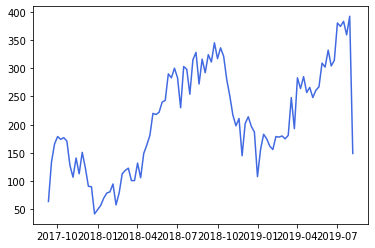

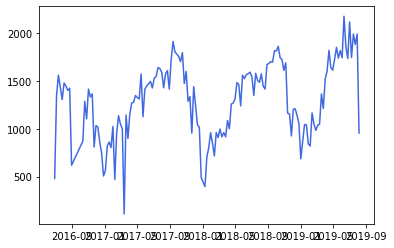

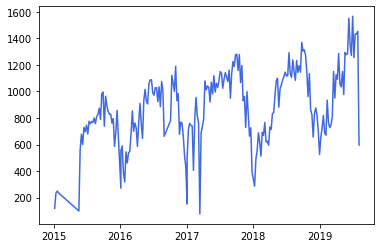

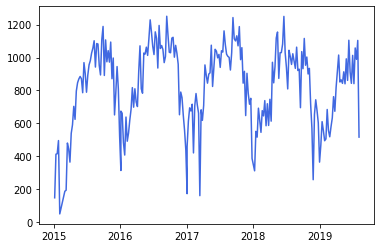

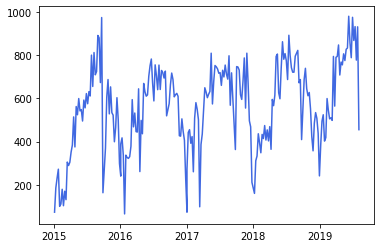

...

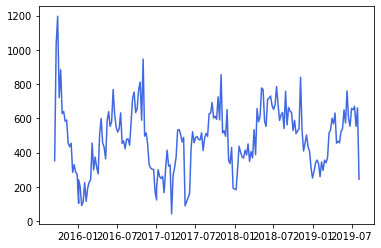

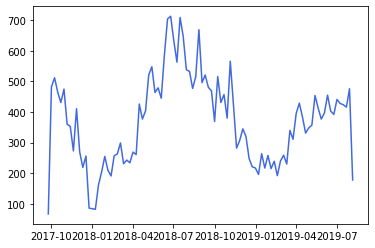

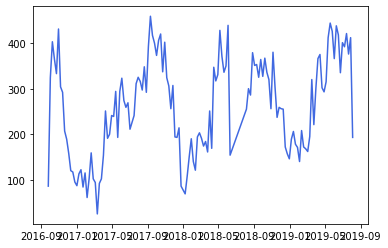

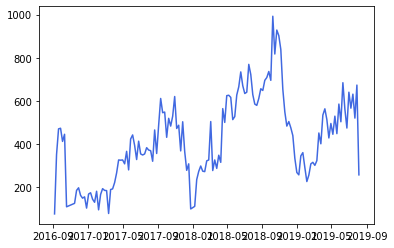

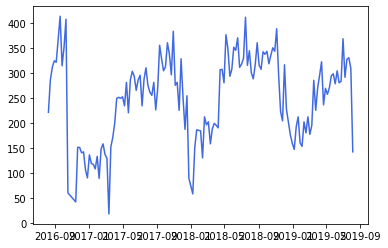

In [ ]:
for station in stationnames:
    #predict_train = model.predict(x_train_normalized)
    y1 =  df['count']
    #y2 =  predict_train 
    #test = pd.DataFrame({ 'y':y1 ,'y2':y2})#

    #test1 = test.iloc[:y_train.shape[0]]
    test1 = pd.DataFrame(df)
    #test1['y'] = y1
    #test1['y2'] = y2
    test1 = test1[test1['station1']==station]
    test1['yearweek'] = pd.to_datetime(test1['start'].astype(str) + ' ' + test1['week'].astype(str) + ' 1',format='%Y %U %w')
    #print(test1)

    plt.plot(test1['yearweek'],test1['count'],label='real' , color = 'royalblue'  )
    plt.title
    plt.show()